# Exploratory Data Analysis 🔍

This exploratory data analysis (EDA) examines salary data for roles in **Data Science**, **Artificial Intelligence (AI)**, and **Machine Learning (ML)** across the years **2020 to 2025**.

In [3]:
# === 🔧 Project setup for Google Colab ===
import sys, os

# ✅ Check if the repo is already cloned into the Colab environment
# (this avoids cloning multiple times if you restart the kernel)
if not os.path.exists("Data-Science-AI-ML-Job-Salaries-2020-2025"):
    # Clone your GitHub repository so Colab has access to all files
    !git clone https://github.com/GdodakisEmmanouil/Data-Science-AI-ML-Job-Salaries-2020-2025.git

# ✅ Navigate into the subfolder where the notebook, data, and functions live
%cd Data-Science-AI-ML-Job-Salaries-2020-2025/Data-Science-AI-ML-Job-Salaries-2020-2025

# ✅ Install all required Python packages from requirements.txt
# (-q flag = quiet mode, to keep the output cleaner)
# If a package is already installed in Colab, this step will just skip it
!pip install -q -r requirements.txt


Cloning into 'Data-Science-AI-ML-Job-Salaries-2020-2025'...
remote: Enumerating objects: 124, done.
remote: Counting objects: 100% (124/124), done.
remote: Compressing objects: 100% (123/123), done.
remote: Total 124 (delta 68), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (124/124), 5.48 MiB | 2.91 MiB/s, done.
Resolving deltas: 100% (68/68), done.
/content/Data-Science-AI-ML-Job-Salaries-2020-2025/Data-Science-AI-ML-Job-Salaries-2020-2025
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 94.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 67.0 MB/s eta 0:00:00


#### Load the dataset and import essential libraries.

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from functions import * # Functions that we created

In [5]:
jobs_data = pd.read_csv('data/salaries.csv')
print(f"We have {jobs_data.shape[0]} rows and {jobs_data.shape[1]} columns in our dataset.")

jobs_data

We have 136757 rows and 11 columns in our dataset.


,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2025,MI,FT,Data Scientist,132600,USD,132600,US,100,US,M
1,2025,MI,FT,Data Scientist,102000,USD,102000,US,100,US,M
2,2025,SE,FT,Data Product Manager,260520,USD,260520,US,0,US,M
3,2025,SE,FT,Data Product Manager,140280,USD,140280,US,0,US,M
4,2025,SE,FT,Machine Learning Engineer,215000,USD,215000,US,0,US,M
...,...,...,...,...,...,...,...,...,...,...,...
136752,2020,SE,FT,Data Scientist,412000,USD,412000,US,100,US,L
136753,2021,MI,FT,Principal Data Scientist,151000,USD,151000,US,100,US,L
136754,2020,EN,FT,Data Scientist,105000,USD,105000,US,100,US,S
136755,2020,EN,CT,Business Data Analyst,100000,USD,100000,US,100,US,L


In [6]:
jobs_data.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136757 entries, 0 to 136756
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   work_year           136757 non-null  int64 
 1   experience_level    136757 non-null  object
 2   employment_type     136757 non-null  object
 3   job_title           136757 non-null  object
 4   salary              136757 non-null  int64 
 5   salary_currency     136757 non-null  object
 6   salary_in_usd       136757 non-null  int64 
 7   employee_residence  136757 non-null  object
 8   remote_ratio        136757 non-null  int64 
 9   company_location    136757 non-null  object
 10  company_size        136757 non-null  object
dtypes: int64(4), object(7)
memory usage: 52.4 MB


#### Data cleaning

Before performing any analysis, it is important to ensure that each column (variable) in our dataset has the correct data type. This helps prevent errors during data processing and enables efficient use of pandas and visualization libraries. Also we must check for missing values and duplicates.

**Missing Values / Duplicates:**

In [7]:
print('Are there missing values in our data frame?')
print(f'Answer: {jobs_data.isna().any().any()}')

# Drop duplicate rows and save the new cleaned data to csv file.
jobs_data.drop_duplicates(inplace = True)
jobs_data.reset_index(drop = True , inplace = True)

print(f'After dropping duplicates we have {jobs_data.shape[0]} rows in our dataset.')
display(jobs_data)

jobs_data.to_csv('data/cleaned_salaries_data.csv', index = False)

Are there missing values in our data frame?
Answer: False
After dropping duplicates we have 66063 rows in our dataset.


,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2025,MI,FT,Data Scientist,132600,USD,132600,US,100,US,M
1,2025,MI,FT,Data Scientist,102000,USD,102000,US,100,US,M
2,2025,SE,FT,Data Product Manager,260520,USD,260520,US,0,US,M
3,2025,SE,FT,Data Product Manager,140280,USD,140280,US,0,US,M
4,2025,SE,FT,Machine Learning Engineer,215000,USD,215000,US,0,US,M
...,...,...,...,...,...,...,...,...,...,...,...
66058,2020,SE,FT,Data Scientist,412000,USD,412000,US,100,US,L
66059,2021,MI,FT,Principal Data Scientist,151000,USD,151000,US,100,US,L
66060,2020,EN,FT,Data Scientist,105000,USD,105000,US,100,US,S
66061,2020,EN,CT,Business Data Analyst,100000,USD,100000,US,100,US,L


**Data Types Fix:**

In [8]:
convert_to_categ = ['experience_level' , 'employment_type', 'remote_ratio' , 'company_size']

for col in convert_to_categ:
    jobs_data[col] = jobs_data[col].astype('category')

jobs_data.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66063 entries, 0 to 66062
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   work_year           66063 non-null  int64   
 1   experience_level    66063 non-null  category
 2   employment_type     66063 non-null  category
 3   job_title           66063 non-null  object  
 4   salary              66063 non-null  int64   
 5   salary_currency     66063 non-null  object  
 6   salary_in_usd       66063 non-null  int64   
 7   employee_residence  66063 non-null  object  
 8   remote_ratio        66063 non-null  category
 9   company_location    66063 non-null  object  
 10  company_size        66063 non-null  category
dtypes: category(4), int64(3), object(4)
memory usage: 15.5 MB


- Memory usage of original data frame: 52.4 MB
- Memory usage of the cleaned data frame: 15.5 MB

#### Basic Descriptive Analysis

- Summary Statistics of Numerical Features
  - Mean
  - Standard Deviation
  - Minimum
  - 25th percentile  
  - 50th percentile point or Median
  - 75th percentile point
  - Maximum
  

 We are interested in the salary expressed in USD to facilitate accurate comparisons.

In [9]:
jobs_data[['salary_in_usd']].describe().round()

,salary_in_usd
count,66063.0
mean,151149.0
std,77439.0
min,15000.0
25%,96000.0
50%,138900.0
75%,190068.0
max,800000.0


- Summary Statistics of Categorical Features
  - Counts  
  - Percentages
  
Some variables — such as `job_title`— have a high number of unique values, making direct conversion to categorical types uninformative at this point. Instead, we'll begin by exploring their distribution. Later, we’ll group similar job titles into broader, more meaningful categories to enhance interpretability. This approach will help us uncover key trends, such as the most common roles, and lay the groundwork for more advanced analysis.

In [10]:
describe_categorical(jobs_data , top_n = 5) # see the function at functions.py


=== experience_level ===
SE: 34743 (52.6%)
MI: 21367 (32.3%)
EN: 7542 (11.4%)
EX: 2411 (3.6%)

=== employment_type ===
FT: 65382 (99.0%)
CT: 348 (0.5%)
PT: 317 (0.5%)
FL: 16 (0.0%)

=== job_title ===
Data Scientist: 6779 (10.3%)
Data Engineer: 6653 (10.1%)
Data Analyst: 6031 (9.1%)
Software Engineer: 4564 (6.9%)
Engineer: 4045 (6.1%)

=== salary_currency ===
USD: 60623 (91.8%)
GBP: 2504 (3.8%)
EUR: 2034 (3.1%)
CAD: 487 (0.7%)
INR: 127 (0.2%)

=== employee_residence ===
US: 55377 (83.8%)
CA: 4083 (6.2%)
GB: 2597 (3.9%)
AU: 451 (0.7%)
NL: 351 (0.5%)

=== remote_ratio ===
0: 49604 (75.1%)
100: 16140 (24.4%)
50: 319 (0.5%)

=== company_location ===
US: 55439 (83.9%)
CA: 4084 (6.2%)
GB: 2605 (3.9%)
AU: 456 (0.7%)
DE: 351 (0.5%)

=== company_size ===
M: 64319 (97.4%)
L: 1529 (2.3%)
S: 215 (0.3%)


#### Simple Data Visualization

In this section, we will perform a simple visual inspection of the distributions of our variables to better understand their patterns and characteristics, which will help us uncover initial insights and guide further analysis.

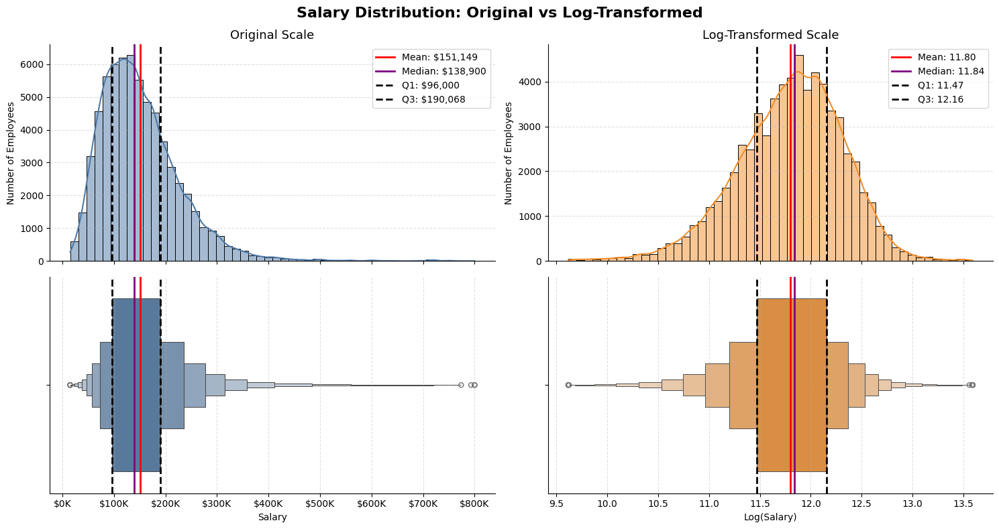

In [11]:
# Calculate statistics for original salary
mean_salary = jobs_data['salary_in_usd'].mean()
median_salary = jobs_data['salary_in_usd'].median()
q1_salary = jobs_data['salary_in_usd'].quantile(0.25)
q3_salary = jobs_data['salary_in_usd'].quantile(0.75)

# Log-transform salary
jobs_data['log_salary_in_usd'] = np.log(jobs_data['salary_in_usd'])

# Calculate statistics for log salary
mean_log_salary = jobs_data['log_salary_in_usd'].mean()
median_log_salary = jobs_data['log_salary_in_usd'].median()
q1_log_salary = jobs_data['log_salary_in_usd'].quantile(0.25)
q3_log_salary = jobs_data['log_salary_in_usd'].quantile(0.75)

# Create 2x2 subplot, share x-axis per column
fig1, axs1 = plt.subplots(2, 2, figsize = (15, 8), sharex = 'col')

# Left column: Original salary histogram (top)
sns.histplot(jobs_data['salary_in_usd'], kde = True , bins = 50, color = "#4E79A7" , alpha = 0.5, ax = axs1[0, 0])
axs1[0, 0].axvline(mean_salary, color = 'red', linewidth = 2, label = f'Mean: ${mean_salary:,.0f}')
axs1[0, 0].axvline(median_salary, color = 'purple', linewidth = 2, label = f'Median: ${median_salary:,.0f}')
axs1[0, 0].axvline(q1_salary, color = 'black', linestyle = '--', linewidth = 2, label = f'Q1: ${q1_salary:,.0f}')
axs1[0, 0].axvline(q3_salary, color = 'black', linestyle = '--', linewidth = 2, label = f'Q3: ${q3_salary:,.0f}')
axs1[0, 0].legend()
axs1[0, 0].set_title('Original Scale', fontsize = 13)
axs1[0, 0].set_ylabel('Number of Employees')
axs1[0, 0].grid(axis = 'y', linestyle = '--', alpha = 0.4)
sns.despine(ax = axs1[0, 0])

# Left column: Original salary boxen plot (bottom)
sns.boxenplot(jobs_data['salary_in_usd'], ax = axs1[1, 0], orient = 'h', color = "#4E79A7")
axs1[1, 0].axvline(mean_salary, color = 'red', linewidth = 2, label = 'Mean')
axs1[1, 0].axvline(median_salary, color = 'purple', linewidth = 2, label = 'Median')
axs1[1, 0].axvline(q1_salary, color = 'black', linestyle = '--', linewidth = 2, label = 'Q1')
axs1[1, 0].axvline(q3_salary, color = 'black', linestyle = '--', linewidth = 2, label = 'Q3')
axs1[1, 0].set_xlabel('Salary')
axs1[1, 0].xaxis.set_major_formatter(FuncFormatter(thousands_formatter))
axs1[1, 0].grid(axis = 'x', linestyle = '--', alpha = 0.4)
sns.despine(ax = axs1[1, 0])

# Right column: Log salary histogram (top)
sns.histplot(jobs_data['log_salary_in_usd'], kde = True, bins = 50, color = "#F28E2B" , alpha = 0.5, ax = axs1[0, 1])
axs1[0, 1].axvline(mean_log_salary, color = 'red', linewidth = 2, label = f'Mean: {mean_log_salary:.2f}')
axs1[0, 1].axvline(median_log_salary, color = 'purple', linewidth = 2, label = f'Median: {median_log_salary:.2f}')
axs1[0, 1].axvline(q1_log_salary, color = 'black', linestyle = '--', linewidth = 2, label = f'Q1: {q1_log_salary:.2f}')
axs1[0, 1].axvline(q3_log_salary, color = 'black' , linestyle = '--', linewidth = 2, label = f'Q3: {q3_log_salary:.2f}')
axs1[0, 1].legend()
axs1[0, 1].set_title('Log-Transformed Scale', fontsize = 13)
axs1[0, 1].set_ylabel('Number of Employees')
axs1[0, 1].grid(axis = 'y', linestyle = '--', alpha = 0.4)
sns.despine(ax = axs1[0, 1])

# Right column: Log salary boxen plot (bottom)
sns.boxenplot(jobs_data['log_salary_in_usd'], ax = axs1[1, 1], orient = 'h', color = "#F28E2B")
axs1[1, 1].axvline(mean_log_salary, color = 'red', linewidth = 2, label = 'Mean')
axs1[1, 1].axvline(median_log_salary, color = 'purple', linewidth = 2, label = 'Median')
axs1[1, 1].axvline(q1_log_salary, color = 'black', linestyle = '--', linewidth = 2, label = 'Q1')
axs1[1, 1].axvline(q3_log_salary, color = 'black', linestyle = '--', linewidth = 2, label = 'Q3')
axs1[1, 1].set_xlabel('Log(Salary)')
axs1[1, 1].grid(axis = 'x', linestyle = '--', alpha = 0.4)
sns.despine(ax = axs1[1, 1])

plt.suptitle("Salary Distribution: Original vs Log-Transformed", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()
plt.close(fig1)

In [12]:
print(f"Skewness: {jobs_data['salary_in_usd'].skew():.2f}")
print(f"Kurtosis: {jobs_data['salary_in_usd'].kurtosis():.2f}")

Skewness: 1.51
Kurtosis: 5.34


- **Skewness** measures the **asymmetry** of the salary distribution.
  - A normal distribution has a skewness of **0**
  - A skewness > 0 indicates **right-skewed** data, meaning a longer tail on the right (high salaries).
  - A skewness < 0 would indicate left-skewed data (not the case here).

- **Kurtosis** measures the **tailedness** of the distribution.
  - A normal distribution has a kurtosis of **3**.
  - A kurtosis **> 3** (called *leptokurtic*) means **sharper peak and heavier tails** — more prone to outliers.
  - A kurtosis **< 3** (*platykurtic*) means a flatter distribution with lighter tails.

*Note*: Sometimes, we use **Excess Kurtosis**, which measures how a distribution's kurtosis deviates from that of a normal distribution. Excess kurtosis is calculated as:
- **Excess Kurtosis = Kurtosis − 3**
  - Excess kurtosis > 0 indicates a distribution with heavier tails than normal (leptokurtic).
  - Excess kurtosis < 0 indicates lighter tails (platykurtic).

Observed Values:
- Skewness: 1.51 (> 0), suggesting the distribution is **right-skewed** (this is common in salary data).
- Kurtosis: 5.34 (> 3), meaning the data has **heavy tails and more extreme values** than a normal distribution.

These observations confirm what we see in the histogram and boxplot of salary distribution: a concentration of salaries at the lower end, with some extreme high earners pulling the mean upward.


A common transformation for positively skewed data is the logarithmic transformation. Typically, we use the natural logarithm for this purpose, which is the logarithm with base $e$ and is written as $ln$. This helps stabilize the variance, normalize the data, and improve the performance of statistical models and analyses that assume normally distributed data. The distribution of $log(salary)$ is also shown above.

In [13]:
label_maps = {
    'experience_level': {'EN': 'Entry-level', 'MI': 'Mid-level', 'SE': 'Senior-level', 'EX': 'Executive-level'},
    'employment_type': {'FT': 'Full-time', 'PT': 'Part-time', 'CT': 'Contract', 'FL': 'Freelance'},
    'remote_ratio': {0: 'No remote work (<20%)', 50: 'Hybrid / Partially remote', 100: 'Fully remote (>80%)'},
    'company_size': {'S': 'Small (<50 employees)', 'M': 'Medium (50–250 employees)', 'L': 'Large (>250 employees)'}
}

currency_symbols = {
    'USD': '$', 'GBP': '£', 'EUR': '€', 'CAD': 'CA$', 'INR': '₹'
}

categorical_vars = [
    'experience_level',
    'employment_type',
    'remote_ratio',
    'company_size',
    'salary_currency',
    'employee_residence',
    'company_location'
]

color_palettes = {
    'experience_level': px.colors.sequential.Blues,
    'employment_type': px.colors.sequential.Purples,
    'remote_ratio': px.colors.sequential.Oranges,
    'company_size': px.colors.sequential.Greens,
    'salary_currency': px.colors.sequential.thermal_r,
    'employee_residence': px.colors.sequential.Aggrnyl_r,
    'company_location': px.colors.sequential.PuRd
}

fig = go.Figure()

for i, var in enumerate(categorical_vars):
    if var in ['salary_currency', 'employee_residence', 'company_location']:
        counts = jobs_data[var].value_counts()
        top5 = counts.head(5)
        percentages = jobs_data[var].value_counts(normalize = True).loc[top5.index] * 100
        percentages = percentages.round(1)
        df = pd.DataFrame({
            'Category': top5.index,
            'Count': top5.values,
            'Percentage': percentages.values
        })

        if var == 'salary_currency':
            df['Category'] = df['Category'].apply(lambda x: f"{x} ({currency_symbols.get(x, '')})")
        else:
            df['Category'] = df['Category'].astype(str)

        df = df.sort_values('Percentage', ascending=False).reset_index(drop=True)
        colors = color_palettes[var][::-1][:len(df)]

    else:
        counts = jobs_data[var].value_counts()
        percentages = jobs_data[var].value_counts(normalize = True) * 100
        df = pd.DataFrame({'Category': counts.index, 'Count': counts.values, 'Percentage': percentages.values})
        df['Category'] = df['Category'].map(lambda x: label_maps[var].get(x, str(x)))
        df = df.sort_values('Percentage', ascending=False).reset_index(drop=True)
        colors = color_palettes[var][::-1][:len(df)]

    fig.add_trace(go.Bar(
        x = df['Category'],
        y = df['Percentage'],
        text = [f"{p:.1f}%<br>n={int(c)}" for p, c in zip(df['Percentage'], df['Count'])],
        marker_color = colors,
        visible = (i == 0),
        customdata = np.stack((df['Percentage'].round(1), df['Count']), axis = -1),
        hovertemplate = "<b>%{x}</b><br>%{customdata[0]:.1f}%%<br>n=%{customdata[1]}<extra></extra>"
    ))

title_map = {
    'experience_level': 'Distribution of Experience Level',
    'employment_type': 'Distribution of Employment Type',
    'remote_ratio': 'Distribution of Remote Ratio',
    'company_size': 'Distribution of Company Size',
    'salary_currency': 'Top 5 Salary Currencies',
    'employee_residence': 'Top 5 Employee Residences',
    'company_location': 'Top 5 Company Locations'
}

buttons = []
for i, var in enumerate(categorical_vars):
    buttons.append(dict(
        label = var.replace('_', ' ').title(),
        method = 'update',
        args=[{'visible': [j == i for j in range(len(categorical_vars))]},
              {'title': title_map[var]}]
    ))

fig.update_layout(
    updatemenus = [dict(
        type = 'dropdown',
        showactive = True,
        active = 0,
        buttons = buttons,
        x = 1.15,
        y = 1,
        xanchor = 'left',
        yanchor = 'top',
    )],
    title = title_map[categorical_vars[0]],
    title_x=0.5,
    yaxis = dict(title = 'Percentage (%)', gridcolor = 'lightgray', range = [0, 110]),
    xaxis = dict(tickangle = 0),
    margin = dict(t = 80, b = 140, r = 200),
    height = 600,
    plot_bgcolor = 'white'
)

fig.show()

#### Job Title Clustering

**Objective**

Job titles in our dataset are highly diverse and often inconsistent, containing many unique variations, abbreviations, and slight differences in wording. This makes it difficult to analyze, categorize, and draw insights from them directly. To address this, we applied **K-Means clustering** to group similar job titles together, simplifying the data and revealing meaningful role clusters.

**Why K-Means?**

K-Means is an unsupervised machine learning algorithm used to partition data into distinct groups (clusters) based on feature similarity. It helps us:
- Group similar job titles without predefined labels.
- Reduce noise caused by small variations in job title wording.
- Uncover natural groupings and patterns in job title data.
- Make downstream analysis, reporting, and HR decisions more manageable and interpretable.

  **How it works:**
  
   K-Means groups data points by minimizing the distance between each point and its assigned cluster center (centroid). In our case, each job title is represented as a vector in multi-dimensional space (using **TF-IDF**). The algorithm iteratively refines the cluster centers until stable groupings emerge. This results in compact, meaningful clusters of similar job titles.

**Methodology**

 1. Data Cleaning
- We standardized job titles by converting them to lowercase.
- Removed any non-alphabetical characters to reduce noise.

 2. Feature Extraction with **TF-IDF (Term Frequency–Inverse Document Frequency)**
- Transformed job titles into numerical vectors using the TF-IDF technique.

   **How it works:**
   
   TF-IDF scores each word based on how important it is in a specific title compared to the entire dataset.
     - TF reflects how often a word appears in a job title.
     - IDF downweights words that appear across many titles (e.g., "senior", "manager").

- This helped highlight unique, meaningful terms, within titles (e.g., “cloud”, “digital”, “data”) and reduced the impact of common words.
- The resulting vectors allow K-Means to cluster titles based on semantic relevance, not just raw frequency.



 3. Clustering with K-Means
- Applied K-Means with **22 clusters** to balance granularity and clarity.
- Each job title was assigned to the nearest cluster centroid, grouping similar roles.

 4. Cluster Analysis and Labeling
- For each cluster, identified top job titles by frequency.
- Created simple, descriptive labels for each cluster to explain their thematic role groupings (e.g., Data Scientist, Data Engineer, BI Roles).
- Developed brief explanations to clarify the typical scope of roles within each cluster.

**Results**
- Clustering reduced thousands of unique job titles into 22 manageable groups.
- Allowed clearer understanding of the role landscape within the dataset.
- Simplified job title analysis for recruiters, HR teams, and data analysts.
- The approach is flexible and can be customized by changing the number of clusters or text processing steps.

*This clustering approach provides a scalable way to organize complex job title data, enabling more efficient categorization and insights.*


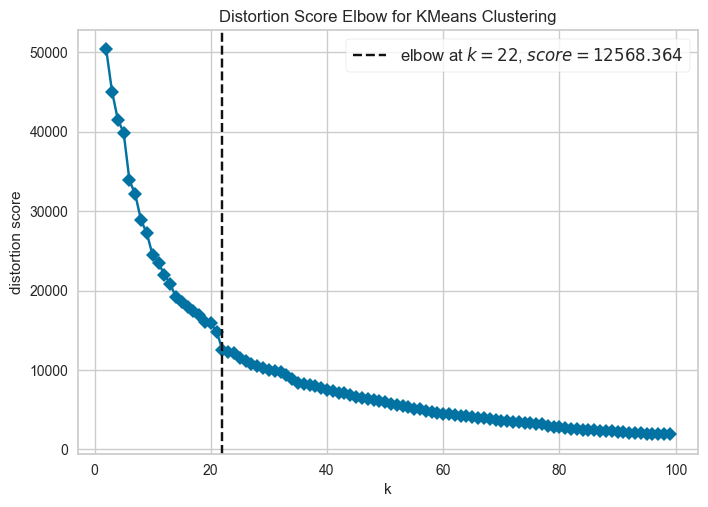

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

# Basic text cleaning
jobs_data['job_title_clean'] = jobs_data['job_title'].str.lower().str.replace('[^a-z ]', '', regex=True)

# Vectorize job titles using TF-IDF
vectorizer = TfidfVectorizer(stop_words = 'english')

job_title_vectors = vectorizer.fit_transform(jobs_data['job_title_clean'])

model = KMeans(random_state = 42)
visualizer = KElbowVisualizer(model, k = (2, 100) , timings = False)
visualizer.fit(job_title_vectors.toarray())  # Convert sparse matrix to dense
visualizer.show()

# Get optimal k
best_k = visualizer.elbow_value_

In [ ]:
kmeans = KMeans(n_clusters = 22, random_state=42)
jobs_data['job_title_cluster'] = kmeans.fit_predict(job_title_vectors)

# View top job titles in each cluster
for i in range(22):
    print(f"\nCluster {i} - Top job titles:")

    cluster_data = jobs_data[jobs_data['job_title_cluster'] == i]['job_title']
    value_counts = cluster_data.value_counts().head(5)
    proportions = cluster_data.value_counts(normalize = True).round(2).head(5) * 100

    for title in value_counts.index:
        count = value_counts[title]
        pct = proportions[title]
        print(f"{title}: {count} ({pct}%)")


Cluster 0 - Top job titles:
Engineer: 4045 (99.0%)
System Engineer: 56 (1.0%)

Cluster 1 - Top job titles:
Data Analyst: 6031 (100.0%)

Cluster 2 - Top job titles:
Data Scientist: 6779 (100.0%)

Cluster 3 - Top job titles:
Manager: 3322 (75.0%)
Data Manager: 650 (15.0%)
Engineering Manager: 482 (11.0%)
Data Scientist Manager: 2 (0.0%)

Cluster 4 - Top job titles:
Software Engineer: 4564 (100.0%)
Software Data Engineer: 3 (0.0%)

Cluster 5 - Top job titles:
Business Intelligence Analyst: 513 (27.0%)
Business Intelligence Engineer: 370 (19.0%)
Business Intelligence Developer: 319 (17.0%)
Business Analyst: 317 (17.0%)
Business Intelligence: 280 (15.0%)

Cluster 6 - Top job titles:
Analytics Engineer: 1239 (80.0%)
Data Analytics Manager: 188 (12.0%)
Data Analytics Specialist: 69 (4.0%)
Analytics Specialist: 47 (3.0%)
Data Analytics Engineer: 5 (0.0%)

Cluster 7 - Top job titles:
Machine Learning Engineer: 3305 (83.0%)
Machine Learning Scientist: 325 (8.0%)
Machine Learning Researcher: 102

**Silhouette Score in Clustering**

🔹 What is the Silhouette Score?

The **Silhouette Score** is a metric used to evaluate how well data points have been clustered. It measures how similar a point is to its own cluster (**cohesion**) compared to other clusters (**separation**). The silhouette ranges from −1 to +1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters. If most objects have a high value, then the clustering configuration is appropriate. If many points have a low or negative value, then the clustering configuration may have too many or too few clusters.

| Silhouette Score Range | Clustering Quality | Interpretation                               |
|------------------------|--------------------|----------------------------------------------|
| 0.71 – 1.00            | Strong         | Well-separated and cohesive clusters         |
| 0.51 – 0.70            | Reasonable     | Some overlap between clusters, but acceptable|
| 0.26 – 0.50            | Weak           | Significant overlap; less meaningful clusters|
| 0.00 – 0.25            | Poor           | No substantial structure in clustering       |
| < 0.00                 | Misclassified  | Data points may be assigned to wrong clusters|

The silhouette score is specialized for measuring cluster quality when the clusters are convex-shaped, and may not perform well if the data clusters have irregular shapes or are of varying sizes. The silhouette can be calculated with any distance metric, such as the Euclidean distance or the Manhattan distance.


| Use Case                      | Purpose                                                    |
|-------------------------------|-------------------------------------------------------------|
| **Unsupervised Learning**     | Evaluate clustering quality without labels                         |
| **Choosing `k` in K-Means**   | Pick the optimal number of clusters                        |

A **silhouette score of 0.71** indicates **well-separated and cohesive clusters** — suggesting that the clustering solution is strong and meaningful.

In [ ]:
from sklearn.metrics import silhouette_score

sil_score = silhouette_score(job_title_vectors, jobs_data['job_title_cluster'])
print(f"Silhouette Score: {sil_score:.3f}")

Silhouette Score: 0.710


| Cluster | Cluster Title        | Top Job Titles                                       | Description                                                                                     |
|---------|----------------------|---------------------------------------------------------------|-------------------------------------------------------------------------------------------------|
| 0       | Engineer             | Engineer (99%), System Engineer (1%)                          | General engineering roles, mostly system engineers involved in technical and infrastructure work. |
| 1       | Data Analyst         | Data Analyst (100%)                                           | Roles focused on analyzing data to provide insights and support decision-making.                 |
| 2       | Data Scientist       | Data Scientist (100%)                                         | Advanced data roles involving statistics, modeling, and predictive analytics.                    |
| 3       | Manager              | Manager (75%), Data Manager (15%), Engineering Manager (11%) | Leadership roles managing teams and projects in engineering, data, and analytics domains.        |
| 4       | Software Engineer    | Software Engineer (100%)                                      | Software development roles focused on coding and building applications.                          |
| 5       | BI Roles             | Business Intelligence Analyst (27%), BI Engineer (19%), Business Analyst (17%) | Roles related to business intelligence, reporting, and translating data into business insights. |
| 6       | Analytics Engineer   | Analytics Engineer (80%), Data Analytics Manager (12%)       | Specialists who build and maintain analytics tools and infrastructure, sometimes managing teams. |
| 7       | Machine Learning Eng.| Machine Learning Engineer (83%), Scientist (8%)              | Experts developing ML models and algorithms for AI-driven projects.                             |
| 8       | Data Architect       | Data Architect (50%), Solutions Architect (17%)              | Roles focused on designing data systems and architectures to support business data needs.       |
| 9       | Data Specialist      | Data Specialist (8%), Applied Scientist (7%), Platform Engineer (5%) | Specialized roles supporting data infrastructure, platforms, and applied data science tasks.    |
| 10      | Systems Engineer     | Systems Engineer (97%), Systems Administrator (3%)           | Roles managing and maintaining IT systems and infrastructure.                                  |
| 11      | Developer            | Developer (33%), Software Developer (25%), BI Developer (10%)| General software development roles across different specialties.                               |
| 12      | Team Lead            | Data Lead (21%), Technical Lead (18%), Analytics Lead (10%)  | Leadership roles guiding technical teams and projects.                                         |
| 13      | Associate            | Associate (84%), Research Associate (12%)                    | Entry-level or supporting roles in data, research, and operations.                             |
| 14      | Data Engineer        | Data Engineer (100%)                                          | Roles focused on building and maintaining data pipelines and infrastructure.                   |
| 15      | Consultant           | Consultant (91%), Data Analytics Consultant (4%)             | Advisory roles providing expertise in data and analytics solutions.                            |
| 16      | Researcher           | Research Scientist (50%), Research Engineer (33%)            | Roles focused on scientific research and advanced technical analysis.                          |
| 17      | Analyst              | Analyst (94%), BI Analyst (6%)                               | Roles focused on analyzing data and business processes.                                       |
| 18      | Software Dev         | Software Development Engineer (99%)                          | Software engineering roles specializing in application development.                           |
| 19      | Data Governance      | Data Governance (38%), Data Governance Analyst (23%)         | Roles ensuring data policies, quality, compliance, and governance.                            |
| 20      | AI Engineer          | AI Engineer (58%), AI Architect (11%)                        | Specialists in artificial intelligence system design, development, and implementation.        |
| 21      | Product Manager      | Product Manager (60%), Data Product Manager (11%)            | Roles managing product lifecycle, strategy, and delivery, often data-related products.        |


In [ ]:
cluster_titles = {
    0: "Engineer",
    1: "Data Analyst",
    2: "Data Scientist",
    3: "Manager",
    4: "Software Engineer",
    5: "BI Roles",
    6: "Analytics Engineer",
    7: "Machine Learning Engineer",
    8: "Data Architect",
    9: "Data Specialist",
    10: "Systems Engineer",
    11: "Developer",
    12: "Team Lead",
    13: "Associate",
    14: "Data Engineer",
    15: "Consultant",
    16: "Researcher",
    17: "Analyst",
    18: "Software Developer",
    19: "Data Governance",
    20: "AI Engineer",
    21: "Product Manager",
}

In [ ]:
jobs_data['job_title_cluster'] = jobs_data['job_title_cluster'].map(cluster_titles)
jobs_data

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,log_salary_in_usd,job_title_clean,job_title_cluster
0,2025,MI,FT,Data Scientist,132600,USD,132600,US,100,US,M,11.795092,data scientist,Data Scientist
1,2025,MI,FT,Data Scientist,102000,USD,102000,US,100,US,M,11.532728,data scientist,Data Scientist
2,2025,SE,FT,Data Product Manager,260520,USD,260520,US,0,US,M,12.470435,data product manager,Product Manager
3,2025,SE,FT,Data Product Manager,140280,USD,140280,US,0,US,M,11.851396,data product manager,Product Manager
4,2025,SE,FT,Machine Learning Engineer,215000,USD,215000,US,0,US,M,12.278393,machine learning engineer,Machine Learning Engineer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66058,2020,SE,FT,Data Scientist,412000,USD,412000,US,100,US,L,12.928779,data scientist,Data Scientist
66059,2021,MI,FT,Principal Data Scientist,151000,USD,151000,US,100,US,L,11.925035,principal data scientist,Data Specialist
66060,2020,EN,FT,Data Scientist,105000,USD,105000,US,100,US,S,11.561716,data scientist,Data Scientist
66061,2020,EN,CT,Business Data Analyst,100000,USD,100000,US,100,US,L,11.512925,business data analyst,BI Roles


In [ ]:
describe_categorical(df = jobs_data , columns = 'job_title_cluster')


=== job_title_cluster ===
Data Specialist: 8139 (12.3%)
Data Scientist: 6779 (10.3%)
Data Engineer: 6654 (10.1%)
Data Analyst: 6031 (9.1%)
Software Engineer: 4567 (6.9%)
Manager: 4456 (6.7%)
Engineer: 4101 (6.2%)
Machine Learning Engineer: 4002 (6.1%)
Analyst: 2655 (4.0%)
Researcher: 2555 (3.9%)
Data Architect: 2301 (3.5%)
Product Manager: 2018 (3.1%)
Developer: 1927 (2.9%)
BI Roles: 1921 (2.9%)
AI Engineer: 1736 (2.6%)
Analytics Engineer: 1553 (2.4%)
Associate: 1347 (2.0%)
Team Lead: 924 (1.4%)
Consultant: 789 (1.2%)
Data Governance: 691 (1.0%)
Systems Engineer: 528 (0.8%)
Software Developer: 389 (0.6%)


In [ ]:
# Prepare data
counts = jobs_data['job_title_cluster'].value_counts()
percentages = jobs_data['job_title_cluster'].value_counts(normalize = True) * 100

# Get top 10
top_10 = counts.head(10).index
top_10_df = pd.DataFrame({
    'Job Title': top_10.astype(str),
    'Count': counts[top_10].values,
    'Percentage': percentages[top_10].values
}).sort_values(by = 'Percentage', ascending = True)


reversed_viridis = px.colors.sequential.Viridis_r

# Plot
fig = go.Figure(go.Bar(
    y = top_10_df['Job Title'],
    x = top_10_df['Percentage'],
    orientation = 'h',
    marker = dict(
        color = top_10_df['Percentage'],
        colorscale = reversed_viridis,
        line = dict(color = 'black')
    ),
    text=[f"n={n} ({p:.1f}%)" for n, p in zip(top_10_df['Count'], top_10_df['Percentage'])],
    textposition = 'inside',
    insidetextanchor = 'end',
    textfont = dict(color = 'white', size = 12),
    hovertemplate="<b>%{y}</b><br>%{text}<extra></extra>"
))

# Layout
fig.update_layout(
    title = dict(
        text = 'Top 10 Job Title Clusters (by %)',
        font_size = 18,
        font_family = 'Arial Black',
        x = 0.5,
        xanchor = 'center'
    ),
    xaxis_title = 'Percentage (%)',
    yaxis_title = '',
    xaxis = dict(
        showgrid = True,
        gridcolor = 'lightgray',
        range = [0, top_10_df['Percentage'].max() + 5]
    ),
    margin = dict(l = 160, r = 60, t = 80, b = 40),
    plot_bgcolor = 'white',
    height = 600
)

fig.show()

#### Salary Drivers and Top-Paying Roles in AI/ML & Data Science

In [ ]:
# Color palettes
color_palettes = {
    'experience_level': 'Blues',
    'employment_type': 'Purples',
    'company_size': 'Greens',
    'remote_ratio': 'Oranges',
    'job_title_cluster': 'Reds',
    'company_location': 'RdPu'
}

# Top 5 highest-paid job titles (by median salary)
top_5_jobs = (
    jobs_data.groupby('job_title_cluster', observed = False)['salary_in_usd']
    .median()
    .sort_values(ascending = False)
    .head(5)
    .index
)


# Top 5 company locations by count
top_5_locations = jobs_data['company_location'].value_counts().head(5).index


# Variables for dropdown
categorical_vars = [
    'experience_level',
    'employment_type',
    'company_size',
    'remote_ratio',
    'job_title_cluster',
    'company_location'
]

fig = go.Figure()
trace_visibility = []
trace_indices = []

for i, var in enumerate(categorical_vars):
    data = jobs_data.copy()

    # Map values if applicable
    data['mapped'] = data[var].map(label_maps.get(var, {})).fillna(data[var].astype(str))

    if var == 'job_title_cluster':
        data = data[data[var].isin(top_5_jobs)]
    if var == 'company_location':
        data = data[data[var].isin(top_5_locations)]

    # Order categories by median salary
    order = data.groupby('mapped', observed = False)['salary_in_usd'].median().sort_values().index.tolist()

    # Assign colors
    palette = px.colors.sequential.__getattribute__(color_palettes[var])
    if len(order) > len(palette):
        palette = (palette * ((len(order) // len(palette)) + 1))[:len(order)]
    else:
        palette = palette[:len(order)]

    n_traces = 0
    for j, category in enumerate(order):
        subset = data[data['mapped'] == category]
        fig.add_trace(go.Violin(
            y = [category] * len(subset),
            x = subset['salary_in_usd'] / 1000,
            orientation = 'h',
            box_visible = True,
            meanline_visible = True,
            line_color = 'black',
            fillcolor = palette[j],
            name = category,
            showlegend = False,
            visible = (i == 0),
            spanmode = 'soft',
            width = 0.8,
            points = 'outliers',
            hovertemplate = f"<b>{category}</b><br>Salary: $%{{x:.0f}}K<extra></extra>"
        ))
        n_traces += 1
        trace_visibility.append(i == 0)
    trace_indices.append(n_traces)

# Create buttons
buttons = []
start_idx = 0
for i, var in enumerate(categorical_vars):
    n_traces = trace_indices[i]
    vis = [False] * len(trace_visibility)
    for idx in range(start_idx, start_idx + n_traces):
        vis[idx] = True

    # Titles
    if var == 'job_title_cluster':
        title = " Salary Distribution of Top 5 Highest-Paid Job Titles"
        label = "Job Title"
    elif var == 'company_location':
        title = "Salary Distribution of Top 5 Company Locations (by Count)"
        label = "Company Location"
    else:
        title = f"Salary Distribution by {var.replace('_', ' ').title()}"
        label = var.replace('_', ' ').title()

    buttons.append(dict(
        label = label,
        method = 'update',
        args = [{'visible': vis},
              {'title': title}]
    ))
    start_idx += n_traces

# Layout
fig.update_layout(
    title = "Salary Distribution by Experience Level",
    title_x = 0.5,
    updatemenus = [dict(
        active = 0,
        buttons = buttons,
        x = 1.05,
        y = 1,
        xanchor = 'left',
        yanchor = 'top'
    )],
    xaxis_title = 'Salary (USD)',
    xaxis = dict(
        tickvals = list(range(0, 850, 100)),
        ticktext = [f"${x}K" for x in range(0, 850, 100)],
        gridcolor = 'lightgray',
        zeroline = False
    ),
    yaxis_title = '',
    height = 600,
    width = 1100,
    plot_bgcolor = 'white',
    margin = dict(t = 100, l = 120, r = 50, b = 40)
)

fig.show()

In [ ]:
# Compute median salary per job per year
agg_df = jobs_data.groupby(["work_year", "job_title_cluster"]).agg(
    median_salary=("salary_in_usd", "median")
).reset_index()

job_titles = agg_df["job_title_cluster"].unique()

fig = go.Figure()

# Add one trace per job title
for job in job_titles:
    df_job = agg_df[agg_df["job_title_cluster"] == job]
    fig.add_trace(go.Scatter(
        x=df_job["work_year"],
        y=df_job["median_salary"],
        mode="lines+markers",
        name=job  # each line has its job title
    ))

# Update layout
fig.update_layout(
    title="Median Salary Trends by Job Title",
    xaxis_title="Year",
    yaxis_title="Median Salary (USD)",
    legend_title="Job Title",
)

fig.show()